<a href="https://colab.research.google.com/github/yujeonghyeop/Bitcoin-Anomaly-Transaction-Detection/blob/main/heatmap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
raw_features=pd.read_csv("https://media.githubusercontent.com/media/GuyenSoto/BTC/master/elliptic_txs_features.csv")
raw_classes=pd.read_csv("https://media.githubusercontent.com/media/GuyenSoto/BTC/master/elliptic_txs_classes.csv")
raw_edgelist=pd.read_csv("https://media.githubusercontent.com/media/GuyenSoto/BTC/master/elliptic_txs_edgelist.csv")

In [ ]:
raw_features.columns = ['id', 'time'] + [f'trans_feat_{i}' for i in range(93)] + [f'agg_feat_{i}' for i in range(72)]
raw_features.head()

,id,time,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,...,agg_feat_62,agg_feat_63,agg_feat_64,agg_feat_65,agg_feat_66,agg_feat_67,agg_feat_68,agg_feat_69,agg_feat_70,agg_feat_71
0,5530458,1,-0.171484,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.162112,...,0.947382,0.673103,-0.979074,-0.978556,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792
1,232022460,1,-0.172107,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.162749,...,0.670883,0.439728,-0.979074,-0.978556,-0.098889,-0.106715,-0.131155,-0.183671,-0.120613,-0.119792
2,232438397,1,0.163054,1.963790,-0.646376,12.409294,-0.063725,9.782742,12.414558,-0.163645,...,-0.577099,-0.613614,0.241128,0.241406,1.072793,0.085530,-0.131155,0.677799,-0.120613,-0.119792
3,230460314,1,1.011523,-0.081127,-1.201369,1.153668,0.333276,1.312656,-0.061584,-0.163523,...,-0.511871,-0.400422,0.517257,0.579382,0.018279,0.277775,0.326394,1.293750,0.178136,0.179117
4,230459870,1,0.961040,-0.081127,-1.201369,1.303743,0.333276,1.480381,-0.061584,-0.163577,...,-0.504702,-0.422589,-0.226790,-0.117629,0.018279,0.277775,0.413931,1.149556,-0.696053,-0.695540


In [ ]:
raw_features = pd.merge(raw_features, raw_classes, left_on='id', right_on='txId', how='left')

In [ ]:
cleaned_df = raw_features.copy()
# You don't want the `Time` column.
cleaned_df.pop('time')
# You don't want the `txId` column.
cleaned_df.pop('txId')
# You don't want the `id` column.
cleaned_df.pop('id')

0           5530458
1         232022460
2         232438397
3         230460314
4         230459870
            ...    
203763    173077460
203764    158577750
203765    158375402
203766    158654197
203767    157597225
Name: id, Length: 203768, dtype: int64

In [ ]:
cleaned_df

,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,trans_feat_8,trans_feat_9,...,agg_feat_63,agg_feat_64,agg_feat_65,agg_feat_66,agg_feat_67,agg_feat_68,agg_feat_69,agg_feat_70,agg_feat_71,class
0,-0.171484,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.162112,-0.167948,-0.049707,...,0.673103,-0.979074,-0.978556,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,unknown
1,-0.172107,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.162749,-0.168576,-0.049707,...,0.439728,-0.979074,-0.978556,-0.098889,-0.106715,-0.131155,-0.183671,-0.120613,-0.119792,unknown
2,0.163054,1.963790,-0.646376,12.409294,-0.063725,9.782742,12.414558,-0.163645,-0.115831,0.043598,...,-0.613614,0.241128,0.241406,1.072793,0.085530,-0.131155,0.677799,-0.120613,-0.119792,2
3,1.011523,-0.081127,-1.201369,1.153668,0.333276,1.312656,-0.061584,-0.163523,0.041399,0.935886,...,-0.400422,0.517257,0.579382,0.018279,0.277775,0.326394,1.293750,0.178136,0.179117,unknown
4,0.961040,-0.081127,-1.201369,1.303743,0.333276,1.480381,-0.061584,-0.163577,0.038305,0.816377,...,-0.422589,-0.226790,-0.117629,0.018279,0.277775,0.413931,1.149556,-0.696053,-0.695540,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203763,-0.145771,-0.163752,0.463609,-0.121970,-0.043875,-0.113002,-0.061584,-0.135803,-0.142008,-0.049707,...,-0.613614,0.241128,0.241406,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,unknown
203764,-0.165920,-0.123607,1.018602,-0.121970,-0.043875,-0.113002,-0.061584,-0.156418,-0.162334,-0.049707,...,0.010822,1.461330,1.461369,-0.098889,-0.087490,-0.084674,-0.140597,-1.760926,-1.760984,unknown
203765,-0.172014,-0.078182,1.018602,0.028105,-0.043875,0.054722,-0.061584,-0.163626,-0.168778,-0.045389,...,1.985050,1.461330,1.461369,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,1
203766,-0.172842,-0.176622,1.018602,-0.121970,-0.043875,-0.113002,-0.061584,-0.163501,-0.169317,-0.049707,...,-0.411776,1.461330,1.461369,-0.098889,-0.087490,-0.084674,-0.140597,1.519700,1.521399,unknown


In [ ]:
mask = cleaned_df['class'].isin(['unknown']) 
cleaned_df = cleaned_df[~mask]
cleaned_df

,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,trans_feat_8,trans_feat_9,...,agg_feat_63,agg_feat_64,agg_feat_65,agg_feat_66,agg_feat_67,agg_feat_68,agg_feat_69,agg_feat_70,agg_feat_71,class
2,0.163054,1.963790,-0.646376,12.409294,-0.063725,9.782742,12.414558,-0.163645,-0.115831,0.043598,...,-0.613614,0.241128,0.241406,1.072793,0.085530,-0.131155,0.677799,-0.120613,-0.119792,2
8,-0.005027,0.578941,-0.091383,4.380281,-0.063725,4.667146,0.851305,-0.163645,-0.144554,0.020069,...,-0.613614,0.241128,0.241406,0.604120,0.008632,-0.131155,0.333211,-0.120613,-0.119792,2
9,-0.147852,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.137933,-0.144108,-0.049707,...,-0.613614,0.241128,0.241406,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,2
10,-0.151357,-0.184668,-1.201369,-0.121970,-0.043875,-0.113002,-0.061584,-0.141519,-0.147643,-0.049707,...,-0.582077,-0.979074,-0.978556,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,2
15,-0.172306,-0.184668,-1.201369,0.028105,-0.043875,-0.029140,0.242712,-0.163640,-0.169115,-0.047227,...,-0.600999,0.241128,0.241406,0.018279,-0.068266,-0.084674,-0.054450,-1.760926,-1.760984,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203751,-0.159293,-0.037276,1.018602,-0.121970,0.035526,-0.113002,-0.061584,-0.149635,-0.155646,-0.049707,...,1.408971,0.231244,-0.388216,-0.098889,1.931078,3.168259,3.707301,-1.390548,-1.214035,2
203753,-0.172962,-0.126566,1.018602,-0.121970,-0.063725,-0.113002,-0.061584,-0.163622,-0.169437,-0.049707,...,0.647874,0.241128,0.241406,10.914916,1.700384,-0.131155,7.914145,-0.120613,-0.119792,2
203758,-0.170412,-0.078164,1.018602,0.028105,-0.043875,0.054722,-0.061584,-0.163631,-0.167106,-0.032993,...,1.606604,1.461330,1.461369,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,1
203762,-0.093732,-0.116160,1.018602,-0.121970,-0.043875,-0.113002,-0.061584,-0.082559,-0.089510,-0.049707,...,-0.613614,0.241128,0.241406,0.018279,-0.087490,-0.131155,-0.097524,-0.120613,-0.119792,2


In [ ]:
data = cleaned_df.copy()

In [ ]:
data['class'] = data['class'].astype('int')

In [ ]:
corr= data.corr()
corr

,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,trans_feat_8,trans_feat_9,...,agg_feat_63,agg_feat_64,agg_feat_65,agg_feat_66,agg_feat_67,agg_feat_68,agg_feat_69,agg_feat_70,agg_feat_71,class
trans_feat_0,1.000000,0.070409,0.095649,0.043574,0.057970,0.036751,0.068972,0.831754,0.973266,0.417012,...,-0.009613,-0.014509,-0.016693,0.001084,0.198155,0.174772,0.112626,0.020071,0.019160,0.052946
trans_feat_1,0.070409,1.000000,0.256756,0.619014,0.031320,0.635275,0.169349,0.003108,0.032653,0.022326,...,0.024304,0.027570,0.028441,0.065861,0.043503,0.029552,0.058403,-0.002976,-0.003413,0.040429
trans_feat_2,0.095649,0.256756,1.000000,0.149501,0.011641,0.155193,0.021668,0.088281,0.088665,0.012715,...,0.122084,0.076001,0.075063,-0.003702,0.039374,0.046675,0.066978,-0.050922,-0.052909,-0.019516
trans_feat_3,0.043574,0.619014,0.149501,1.000000,0.006044,0.985769,0.322540,-0.026573,0.000574,0.009656,...,0.000620,0.026704,0.027415,0.064482,0.027402,0.025243,0.050417,-0.008465,-0.009121,0.033160
trans_feat_4,0.057970,0.031320,0.011641,0.006044,1.000000,0.006377,0.000922,0.066786,0.061005,0.006417,...,0.028505,0.004142,0.004447,-0.007586,0.112189,0.017777,0.000337,-0.001668,-0.002646,0.016233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
agg_feat_68,0.174772,0.029552,0.046675,0.025243,0.017777,0.015968,0.116867,0.033124,0.141445,0.107186,...,0.016674,0.010674,0.012421,-0.004410,0.906896,1.000000,0.852395,-0.022330,-0.015918,0.035980
agg_feat_69,0.112626,0.058403,0.066978,0.050417,0.000337,0.042594,0.114036,0.018258,0.087274,0.066740,...,-0.003851,0.014452,0.015650,0.350956,0.669950,0.852395,1.000000,-0.033460,-0.028370,0.051078
agg_feat_70,0.020071,-0.002976,-0.050922,-0.008465,-0.001668,-0.007893,-0.006925,0.023211,0.022139,0.005541,...,0.045835,-0.137896,-0.137520,-0.018017,-0.015563,-0.022330,-0.033460,1.000000,0.995125,0.034117
agg_feat_71,0.019160,-0.003413,-0.052909,-0.009121,-0.002646,-0.008633,-0.006688,0.021566,0.021032,0.005911,...,0.045654,-0.140346,-0.139896,-0.017655,-0.009712,-0.015918,-0.028370,0.995125,1.000000,0.033746


In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
corr_sort = abs(data.corr()['class']).sort_values()
corr_sort = corr_sort[corr_sort < 0.03]
print(type(corr_sort))
print(corr_sort)
print(len(corr_sort))

<class 'pandas.core.series.Series'>
agg_feat_17      0.000067
agg_feat_59      0.000131
agg_feat_58      0.000142
agg_feat_35      0.000568
agg_feat_16      0.000915
                   ...   
agg_feat_64      0.026698
agg_feat_67      0.027913
trans_feat_81    0.028332
trans_feat_75    0.029318
agg_feat_46      0.029939
Name: class, Length: 62, dtype: float64
62


In [ ]:
pdpd = pd.DataFrame(corr_sort)
deletearray = pdpd.index
print(deletearray)

Index(['agg_feat_17', 'agg_feat_59', 'agg_feat_58', 'agg_feat_35',
       'agg_feat_16', 'trans_feat_38', 'trans_feat_37', 'agg_feat_34',
       'agg_feat_42', 'trans_feat_69', 'agg_feat_22', 'agg_feat_52',
       'agg_feat_23', 'agg_feat_53', 'trans_feat_14', 'agg_feat_28',
       'agg_feat_11', 'trans_feat_72', 'agg_feat_29', 'agg_feat_10',
       'trans_feat_56', 'trans_feat_71', 'agg_feat_7', 'trans_feat_55',
       'trans_feat_49', 'agg_feat_66', 'trans_feat_43', 'agg_feat_41',
       'agg_feat_9', 'agg_feat_40', 'agg_feat_5', 'trans_feat_50',
       'trans_feat_87', 'trans_feat_15', 'trans_feat_13', 'trans_feat_4',
       'trans_feat_44', 'trans_feat_33', 'agg_feat_4', 'trans_feat_36',
       'agg_feat_45', 'trans_feat_35', 'trans_feat_70', 'trans_feat_2',
       'agg_feat_6', 'trans_feat_34', 'trans_feat_32', 'trans_feat_26',
       'agg_feat_21', 'trans_feat_63', 'trans_feat_57', 'trans_feat_25',
       'trans_feat_31', 'trans_feat_6', 'trans_feat_12', 'trans_feat_9',
       'a

In [ ]:
print(len(deletearray))

62


In [ ]:
for i in deletearray:
  print("'"+i+"'")

'agg_feat_17'
'agg_feat_59'
'agg_feat_58'
'agg_feat_35'
'agg_feat_16'
'trans_feat_38'
'trans_feat_37'
'agg_feat_34'
'agg_feat_42'
'trans_feat_69'
'agg_feat_22'
'agg_feat_52'
'agg_feat_23'
'agg_feat_53'
'trans_feat_14'
'agg_feat_28'
'agg_feat_11'
'trans_feat_72'
'agg_feat_29'
'agg_feat_10'
'trans_feat_56'
'trans_feat_71'
'agg_feat_7'
'trans_feat_55'
'trans_feat_49'
'agg_feat_66'
'trans_feat_43'
'agg_feat_41'
'agg_feat_9'
'agg_feat_40'
'agg_feat_5'
'trans_feat_50'
'trans_feat_87'
'trans_feat_15'
'trans_feat_13'
'trans_feat_4'
'trans_feat_44'
'trans_feat_33'
'agg_feat_4'
'trans_feat_36'
'agg_feat_45'
'trans_feat_35'
'trans_feat_70'
'trans_feat_2'
'agg_feat_6'
'trans_feat_34'
'trans_feat_32'
'trans_feat_26'
'agg_feat_21'
'trans_feat_63'
'trans_feat_57'
'trans_feat_25'
'trans_feat_31'
'trans_feat_6'
'trans_feat_12'
'trans_feat_9'
'agg_feat_65'
'agg_feat_64'
'agg_feat_67'
'trans_feat_81'
'trans_feat_75'
'agg_feat_46'


In [ ]:
bcor = data.corr()
bcor['class'] = abs(bcor['class'])
for i in deletearray:
  bcor.drop(i, inplace =True)
bcor


,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,trans_feat_8,trans_feat_9,...,agg_feat_63,agg_feat_64,agg_feat_65,agg_feat_66,agg_feat_67,agg_feat_68,agg_feat_69,agg_feat_70,agg_feat_71,class
trans_feat_0,1.000000,0.070409,0.095649,0.043574,0.057970,0.036751,0.068972,0.831754,0.973266,0.417012,...,-0.009613,-0.014509,-0.016693,0.001084,0.198155,0.174772,0.112626,0.020071,0.019160,0.052946
trans_feat_1,0.070409,1.000000,0.256756,0.619014,0.031320,0.635275,0.169349,0.003108,0.032653,0.022326,...,0.024304,0.027570,0.028441,0.065861,0.043503,0.029552,0.058403,-0.002976,-0.003413,0.040429
trans_feat_3,0.043574,0.619014,0.149501,1.000000,0.006044,0.985769,0.322540,-0.026573,0.000574,0.009656,...,0.000620,0.026704,0.027415,0.064482,0.027402,0.025243,0.050417,-0.008465,-0.009121,0.033160
trans_feat_5,0.036751,0.635275,0.155193,0.985769,0.006377,1.000000,0.202949,-0.027210,-0.002385,0.007611,...,0.004630,0.027377,0.028085,0.057552,0.016904,0.015968,0.042594,-0.007893,-0.008633,0.031181
trans_feat_7,0.831754,0.003108,0.088281,-0.026573,0.066786,-0.027210,-0.010058,1.000000,0.866618,-0.003253,...,-0.007161,-0.020339,-0.023338,-0.011138,0.044613,0.033124,0.018258,0.023211,0.021566,0.044420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
agg_feat_68,0.174772,0.029552,0.046675,0.025243,0.017777,0.015968,0.116867,0.033124,0.141445,0.107186,...,0.016674,0.010674,0.012421,-0.004410,0.906896,1.000000,0.852395,-0.022330,-0.015918,0.035980
agg_feat_69,0.112626,0.058403,0.066978,0.050417,0.000337,0.042594,0.114036,0.018258,0.087274,0.066740,...,-0.003851,0.014452,0.015650,0.350956,0.669950,0.852395,1.000000,-0.033460,-0.028370,0.051078
agg_feat_70,0.020071,-0.002976,-0.050922,-0.008465,-0.001668,-0.007893,-0.006925,0.023211,0.022139,0.005541,...,0.045835,-0.137896,-0.137520,-0.018017,-0.015563,-0.022330,-0.033460,1.000000,0.995125,0.034117
agg_feat_71,0.019160,-0.003413,-0.052909,-0.009121,-0.002646,-0.008633,-0.006688,0.021566,0.021032,0.005911,...,0.045654,-0.140346,-0.139896,-0.017655,-0.009712,-0.015918,-0.028370,0.995125,1.000000,0.033746


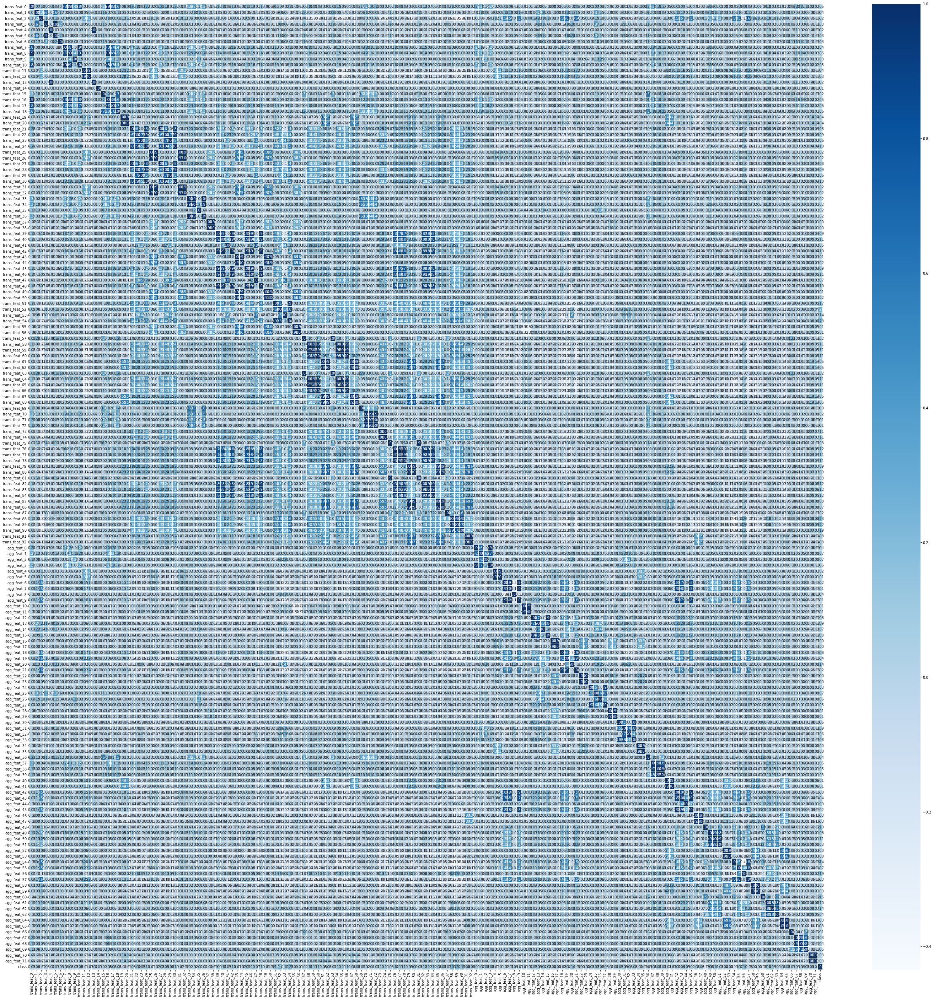

In [ ]:
%matplotlib inline   
import matplotlib.pyplot as plt 
import seaborn as sns    
plt.figure(figsize=(50,50))
sns.heatmap(cor, annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')

전체히트맵

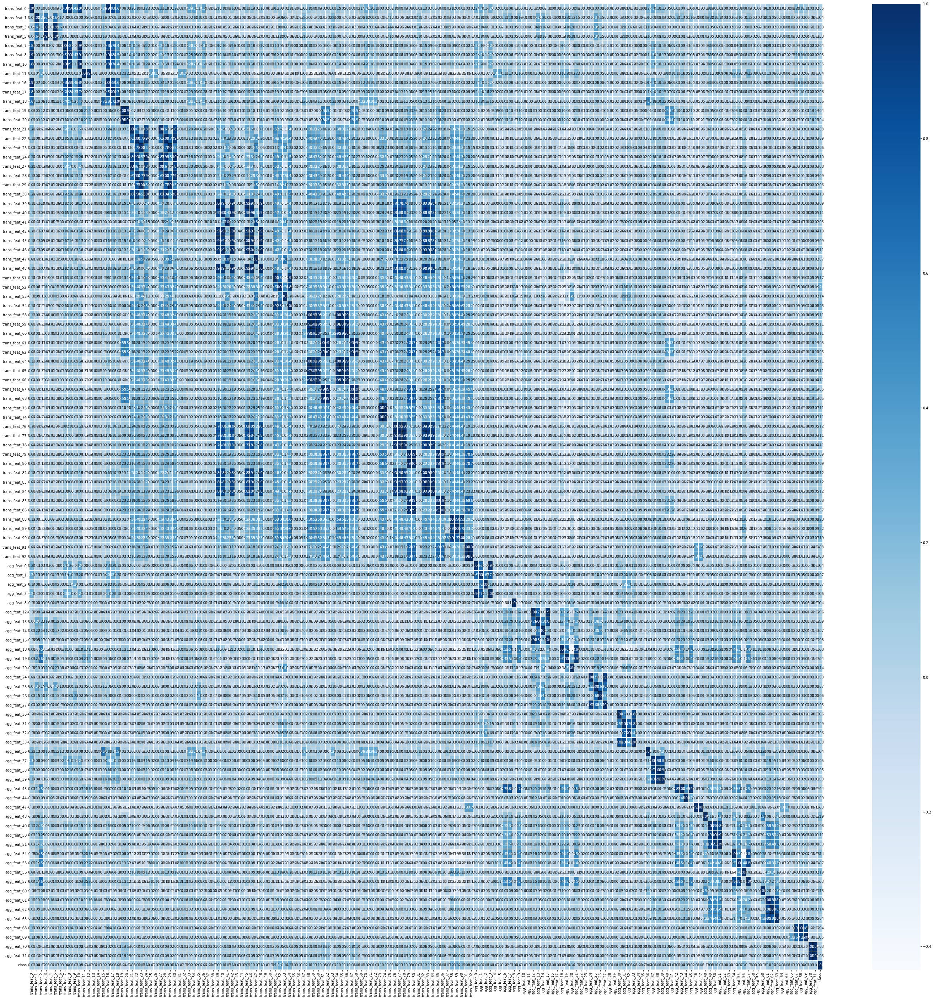

In [ ]:
%matplotlib inline   
import matplotlib.pyplot as plt 
import seaborn as sns    
plt.figure(figsize=(50,50))
sns.heatmap(bcor, annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')

Trans feature 히트맵

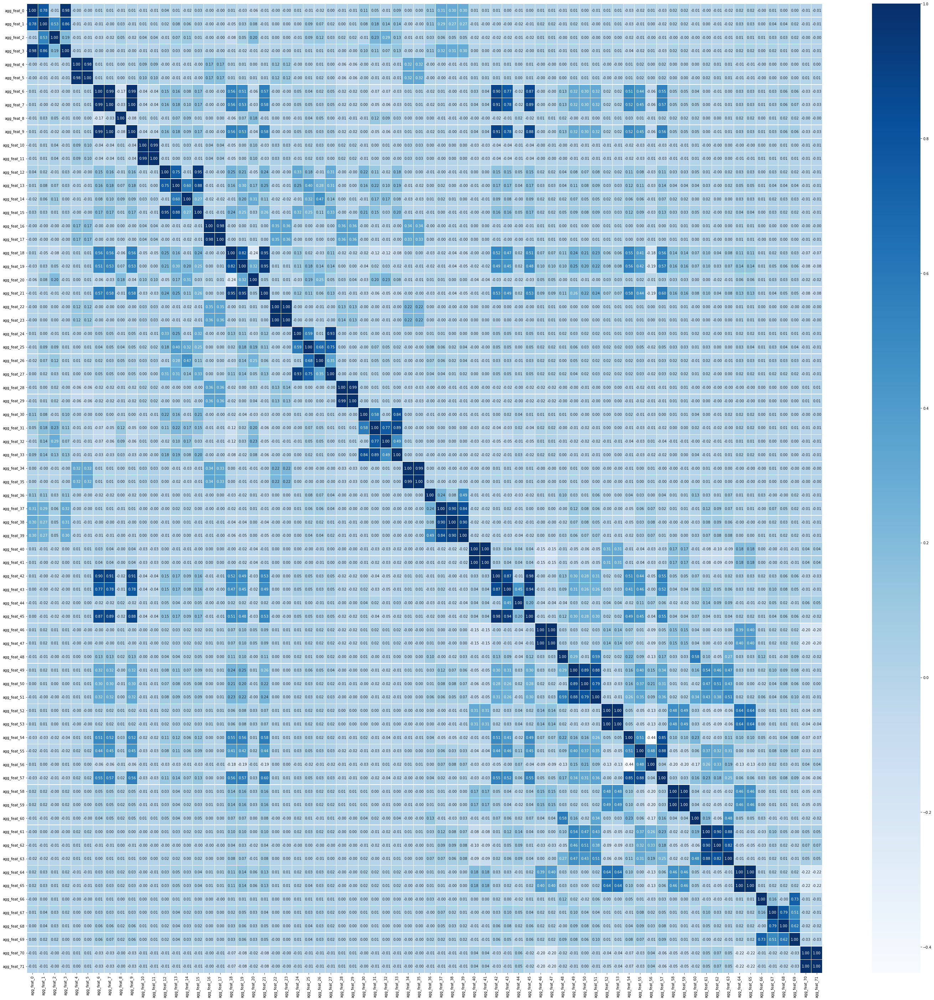

In [ ]:
%matplotlib inline   
import matplotlib.pyplot as plt 
import seaborn as sns    
plt.figure(figsize=(50,50))
sns.heatmap(data = data_2.corr(), annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')

agg ㄹe

In [ ]:
data_1.corr()

,trans_feat_0,trans_feat_1,trans_feat_2,trans_feat_3,trans_feat_4,trans_feat_5,trans_feat_6,trans_feat_7,trans_feat_8,trans_feat_9,...,trans_feat_83,trans_feat_84,trans_feat_85,trans_feat_86,trans_feat_87,trans_feat_88,trans_feat_89,trans_feat_90,trans_feat_91,trans_feat_92
trans_feat_0,1.000000,0.022768,-0.051001,0.005998,0.029854,0.005604,-0.000375,0.977687,0.995457,0.153821,...,0.012852,0.009228,0.005048,0.003339,-0.020479,0.019229,0.007502,-0.004020,0.013290,0.012948
trans_feat_1,0.022768,1.000000,0.201353,0.537526,0.151754,0.543661,0.102848,0.001016,0.010437,0.023642,...,-0.022837,-0.014269,-0.013812,-0.015605,0.009245,0.050000,-0.019744,-0.005141,0.003523,0.002100
trans_feat_2,-0.051001,0.201353,1.000000,0.098263,0.032058,0.100424,0.011710,-0.058289,-0.054038,0.013707,...,-0.012601,-0.018095,-0.110778,-0.111312,-0.117283,-0.120500,-0.154544,-0.187205,0.028877,0.027374
trans_feat_3,0.005998,0.537526,0.098263,1.000000,0.008116,0.957401,0.306911,-0.019844,-0.010962,0.016459,...,-0.023241,-0.010052,-0.012733,-0.013896,0.046526,0.015875,-0.017957,0.016588,0.005501,0.004909
trans_feat_4,0.029854,0.151754,0.032058,0.008116,1.000000,0.007230,0.005528,0.028549,0.029467,0.007790,...,-0.009642,-0.010817,-0.008631,-0.009271,-0.014518,0.118292,0.020700,0.038578,0.000939,0.001005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
trans_feat_88,0.019229,0.050000,-0.120500,0.015875,0.118292,0.011669,0.016918,0.007449,0.017160,0.063200,...,0.336807,0.336525,0.159659,0.156457,0.336920,1.000000,0.876431,0.902336,0.106537,0.104484
trans_feat_89,0.007502,-0.019744,-0.154544,-0.017957,0.020700,-0.019838,0.005709,0.002232,0.007355,0.038901,...,0.361965,0.351095,0.167942,0.166728,-0.010886,0.876431,1.000000,0.744169,0.110405,0.109083
trans_feat_90,-0.004020,-0.005141,-0.187205,0.016588,0.038578,0.007731,0.027287,-0.012295,-0.006150,0.042402,...,0.348420,0.364202,0.175188,0.174311,0.643736,0.902336,0.744169,1.000000,0.101765,0.100648
trans_feat_91,0.013290,0.003523,0.028877,0.005501,0.000939,0.003876,0.008543,0.011046,0.012687,0.014022,...,0.153550,0.151258,0.568380,0.568906,0.029992,0.106537,0.110405,0.101765,1.000000,0.997029
